# Estimating albedo

This notebook explores various ways to estimate albedo from an image

Start by loading some images that are locally available and have been segmented

In [1]:
from streetscapes.streetview import SVWorkspace
from pathlib import Path
from streetscapes.utils import get_env

# Load metadata about subset
ws = SVWorkspace("amsterdam")
metadata = ws.load_metadata('subset_lcz_kittner_081.parquet')

# Locally available images/segmentations
image_dir = Path(get_env('DATA_HOME')) / 'sources' / 'mapillary' / 'images'
segmentation_dir = Path(get_env('DATA_HOME')) / 'sources' / 'mapillary' / 'images' / 'segmentations' / 'dinosam'
existing_images = {p.stem for p in image_dir.glob('*.jpeg')}
existing_segmentations = {p.stem for p in segmentation_dir.glob('*.npz')}

metadata['is_local'] = metadata['id'].isin(existing_segmentations) & metadata['id'].isin(existing_segmentations)

local_images = metadata.query('is_local')
print(f"{len(local_images)} images out of {len(metadata)} available locally and segmented.")
local_images.head()

94943 images out of 96054 available locally and segmented.


,id,altitude,atomic_scale,camera_type,captured_at,compass_angle,computed_altitude,computed_compass_angle,computed_rotation,exif_orientation,...,geometry.coordinates,lon,lat,geometry,source,is_local,captured_at_dt,captured_at_str,raster_cell,lcz_class
0,3854378198155609,4.31,1.033452,perspective,1742821919140,15.000000,4.584675,16.783863,"[1.3047539558113, -0.17564039992516, 0.2711136...",1,...,"[4.7008042, 52.4994143]",4.700804,52.499414,POINT (4.7008 52.49941),mapillary,True,2025-03-24 13:11:59.140000+00:00,20250324131159,272006,9
1,2483706531965970,0.00,0.987200,perspective,1742822460800,15.785404,1.428816,13.606351,"[1.4973475791743, -0.15261855106043, 0.2186178...",1,...,"[4.70077892, 52.49936526]",4.700779,52.499365,POINT (4.70078 52.49937),mapillary,True,2025-03-24 13:21:00.800000+00:00,20250324132100,272006,9
2,1086961293461276,4.36,1.033377,perspective,1742821919260,16.800000,4.413224,16.691111,"[1.3086862307343, -0.17478269574192, 0.2698490...",1,...,"[4.7008179, 52.4994428]",4.700818,52.499443,POINT (4.70082 52.49944),mapillary,True,2025-03-24 13:11:59.260000+00:00,20250324131159,272006,9
3,2107430053033222,-4.59,0.803621,perspective,1742821395920,15.950000,6.808564,181.240053,"[0.01214301537597, 2.1543496775437, -2.2546258...",1,...,"[4.7008716, 52.4994312]",4.700872,52.499431,POINT (4.70087 52.49943),mapillary,True,2025-03-24 13:03:15.920000+00:00,20250324130315,272006,9
4,4016449705076377,0.00,2.521685,perspective,1614607043006,195.805857,4.822332,184.428869,"[-0.12561958987769, -2.3116185503337, 2.170021...",1,...,"[4.7006798999981, 52.5]",4.700680,52.500000,POINT (4.70068 52.5),mapillary,True,2021-03-01 13:57:23.006000+00:00,20210301135723,272006,9


<Axes: >

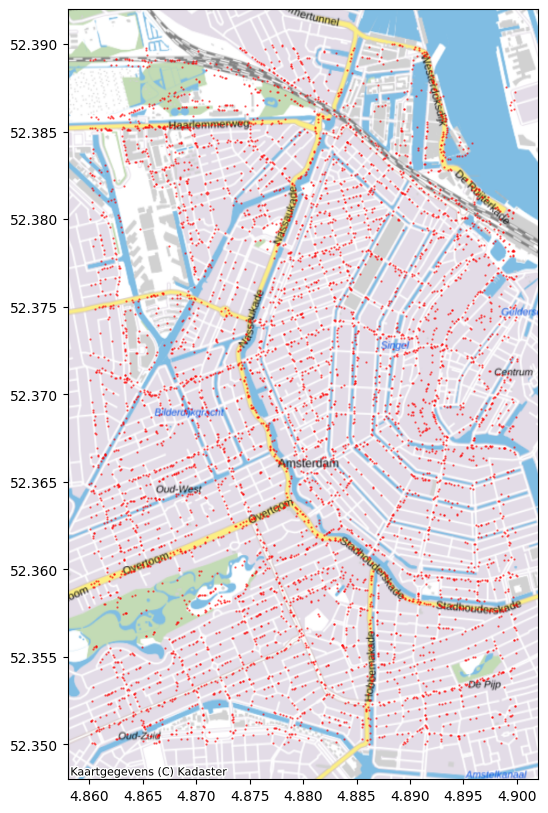

In [2]:
# Define a small subset
from streetscapes.utils import plot_metadata

sample = local_images.cx[4.86:4.9, 52.35:52.39]
plot_metadata(sample)

## Play with options

I implemented various metrics:

* "HSV V" aka value, 
* "HSL L" aka lightness
* Relative luminance https://en.wikipedia.org/wiki/Relative_luminance
* Illumination - running a gaussian filter over the image to determine the 'local' overall brightness as an attempt to account for shadows etc. You can play with the variance of the filter to get more local vs global brightness corrections. Running the filter in log space is similar to the retinex approach described in 

In [ ]:
from PIL import Image
from streetscapes.streetview.image_processing import luminance_map, estimate_illumination, lightness_map, value_map
from streetscapes.streetview.workspace import get_segmentations_dir
from streetscapes.streetview import SVSegmentation

results = []

for _, image in sample.sample(20, random_state=45).iterrows():
    segdir = get_segmentations_dir('mapillary', 'dinosam')
    segmentation = SVSegmentation(segdir / f'{image.id}.npz')
    buildings = segmentation.get_instances("building", exclude=['window', 'doors'], merge=True)

    if buildings:
        img = Image.open(segmentation.image_path)
        building_mask = buildings.mask

        # Calculate metrics
        L = lightness_map(img)
        V = value_map(img)
        Y = luminance_map(img)

        # Naive albedo assuming even light intensity estimated by to maximum pixel reflectance
        albedo_map = Y / (Y.max())

        # Store everything together for this image
        results.append({
            "id": image.id,
            "img": img,
            "lightness_map": L,
            "value_map": V,
            "luminance_map": Y,
            "albedo_map": albedo_map,
            "mean_lightness": L[buildings.mask].mean().item(),
            "mean_value": V[buildings.mask].mean().item(),
            "mean_luminance": Y[buildings.mask].mean().item(),
            "mean_albedo": albedo_map[buildings.mask].mean().item()
        })

TypeError: unsupported operand type(s) for /: 'float' and 'builtin_function_or_method'

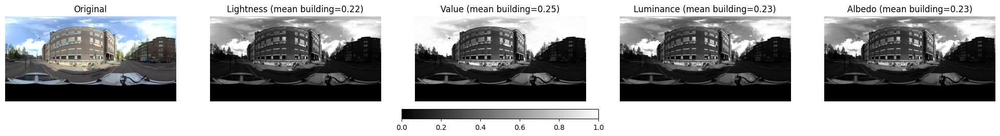

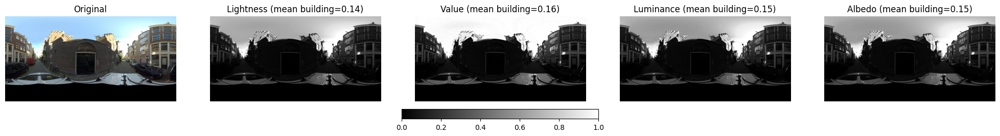

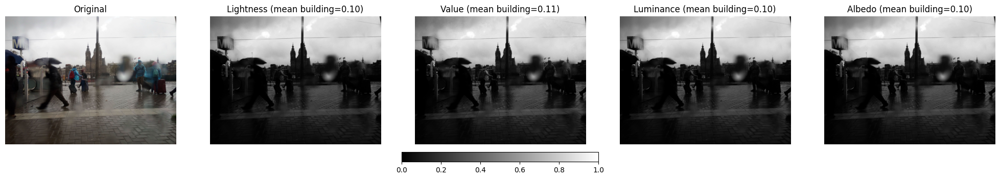

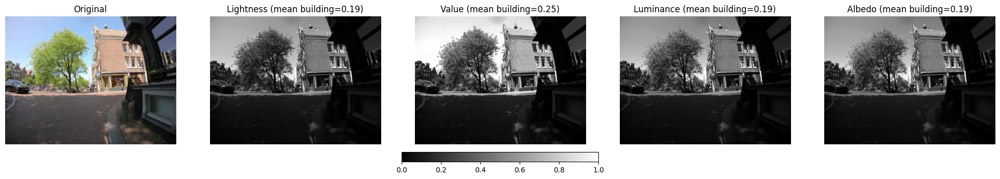

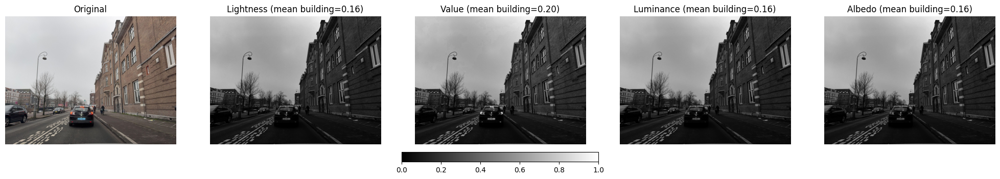

...

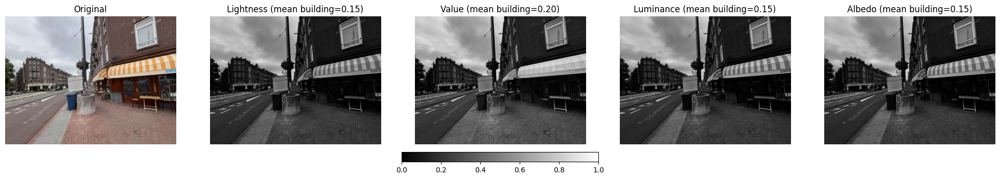

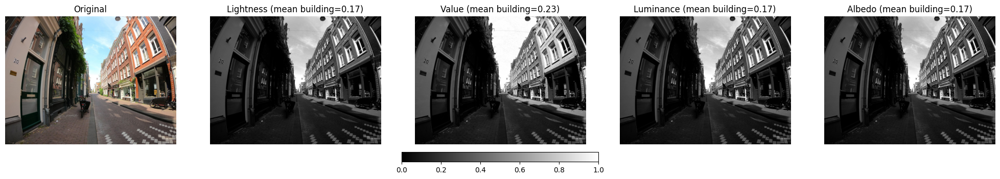

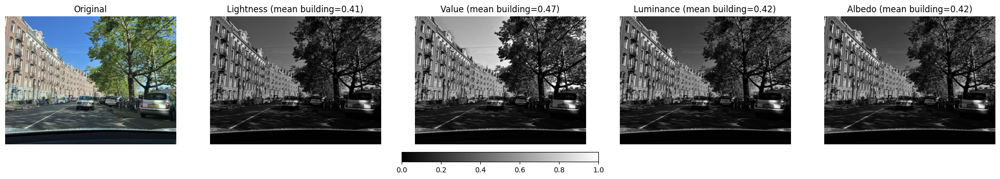

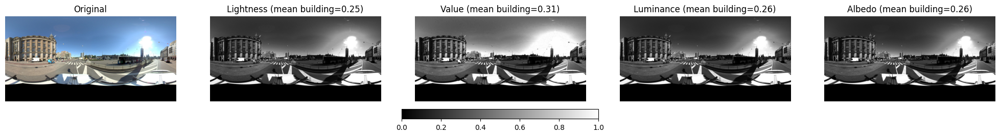

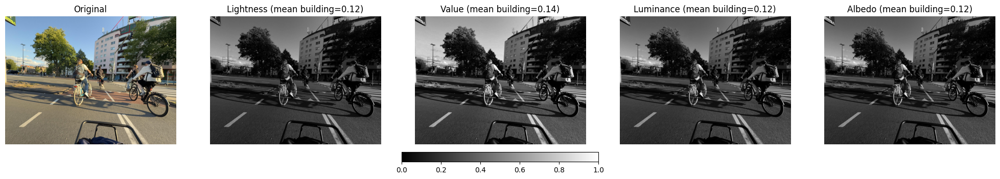

In [ ]:
import matplotlib.pyplot as plt

for res in results:
    fig, axs = plt.subplots(1, 5, figsize=(25, 5))

    # Original
    axs[0].imshow(res["img"])
    axs[0].set_title("Original")
    axs[0].axis('off')

    # Lightness
    im1 = axs[1].imshow(res["lightness_map"], cmap='gray', vmin=0, vmax=1)
    axs[1].set_title(f"Lightness (mean building={res['mean_lightness']:.2f})")
    axs[1].axis('off')

    # Value
    im2 = axs[2].imshow(res["value_map"], cmap='gray', vmin=0, vmax=1)
    axs[2].set_title(f"Value (mean building={res['mean_value']:.2f})")
    axs[2].axis('off')

    # Luminance
    im3 = axs[3].imshow(res["luminance_map"], cmap='gray', vmin=0, vmax=1)
    axs[3].set_title(f"Luminance (mean building={res['mean_luminance']:.2f})")
    axs[3].axis('off')

    # Albedo
    im4 = axs[4].imshow(res["albedo_map"], cmap='gray', vmin=0, vmax=1)
    axs[4].set_title(f"Albedo (mean building={res['mean_albedo']:.2f})")
    axs[4].axis('off')

    # Shared colorbar for all grayscale maps (exclude original)
    cbar = fig.colorbar(im4, ax=axs, orientation='horizontal', fraction=0.05, pad=0.04)

    plt.show()

## Correcting images

From the wikipedia entry on color constancy:

> D. H. Foster (2011) states, "in the natural environment, the source itself may not be well defined in that the illumination at a particular point in a scene is usually a complex mixture of direct and indirect [light] distributed over a range of incident angles, in turn modified by local occlusion and mutual reflection, all of which may vary with time and position."

Below it outlines a simple algorithm for retinex correction: https://en.wikipedia.org/wiki/Color_constancy#Retinex_theory

In [ ]:
retinex_global = img / img.max(axis=(0, 1), keepdims=True)

Basically this is dividing all pixel by the max per channel. But since most images will have a fully saturated pixel in each band, that doesn't do much. 

An alternative is local retinex, i.e. calculate local illumination by taking the
locally smoothed intensity in each band, using a guassian blur to control the
scale. Combining multiple variances yield the multiscale retinex(MSC). This
package implements it:

- https://github.com/gui-miotto/retinex/tree/main
- https://cs.wellesley.edu/~cs332/imageEnhance.pdf

Let's see if it improves our image

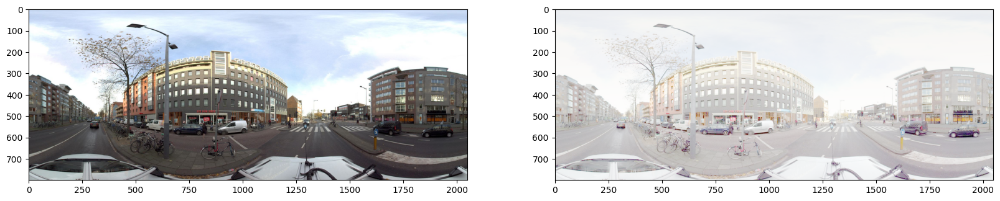

In [ ]:
import skimage
from retinex import msrcr
import matplotlib.pyplot as plt

image_path = Path('/projects/prjs0914/streetscapes/data/sources/mapillary/images/')
image_id = '1728589477321224'
image = image_path / f"{image_id}.jpeg"

img = skimage.io.imread(image)[:800,:,:]  # crop off bottom black patch # [:, 658:1211, :]  # uncomment last bit to crop out an individual building
img_msrcr = msrcr(img, sigmas=(500., 500), color_correction=False)

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

axs[0].imshow(img)
axs[1].imshow(img_msrcr)

Not super impressive, but perhaps I need to play more with the parameters...
Let's unpacke see what the package does internally:

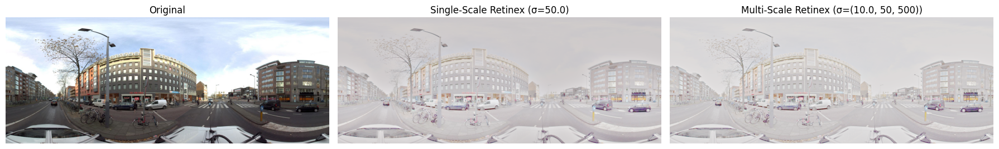

In [ ]:
from retinex.retinex import _ssr, _msr, _normalize_channels

# Convert image to float64 0-255 for retinex package
img_orig = skimage.util.img_as_ubyte(img).astype(np.float64)

# Save per-channel min/max for normalization
img_min = img_orig.min(axis=(0, 1))
img_max = img_orig.max(axis=(0, 1))

# Zero-suppression to avoid log(0)
zero_supressed_img = img_orig + 1.0

# Single-Scale Retinex (SSR) for one sigma
sigma_single = 50.
ssr_img = _ssr(zero_supressed_img, sigma=sigma_single)
ssr_img = _normalize_channels(ssr_img, vmin=img_min, vmax=img_max)
ssr_img = ssr_img.astype(np.ubyte)

# Multi-Scale Retinex (MSR)
sigmas_msr = (10., 50, 500)
msr_img = _msr(zero_supressed_img, sigmas=sigmas_msr)
msr_img = _normalize_channels(msr_img, vmin=img_min, vmax=img_max)
msr_img = msr_img.astype(np.ubyte)

# Plot side by side
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].imshow(img_orig.astype(np.uint8))
axs[0].set_title("Original")
axs[0].axis("off")

axs[1].imshow(ssr_img)
axs[1].set_title(f"Single-Scale Retinex (σ={sigma_single})")
axs[1].axis("off")

axs[2].imshow(msr_img)
axs[2].set_title(f"Multi-Scale Retinex (σ={sigmas_msr})")
axs[2].axis("off")

plt.tight_layout()
plt.show()


The idea behind (multi-scale) retinex correction is interesting, though. If we estimate the illumination of a scene as the local average luminance, we can obtain albedo by dividing luminance by local illumination. This is implemented in streetscapes as well. We can play with the sigma and whether we want to apply the filter in lin or log space.

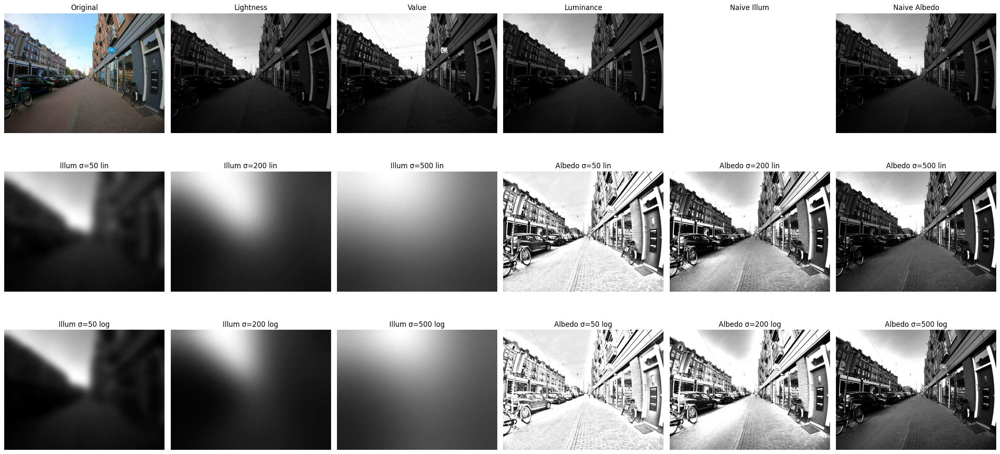

In [ ]:
from PIL import Image
from streetscapes.streetview.image_processing import luminance_map, lightness_map, value_map
import matplotlib.pyplot as plt
import numpy as np

sigma_values = [50, 200, 500]
# sigma_values = [10, 30, 70]

# Load image
image_path = Path('/projects/prjs0914/streetscapes/data/sources/mapillary/images/')
image_id = '2495329917284808'
# image_id = '1728589477321224' 
image_id = 2393486134144530
image = Image.open(image_path / f"{image_id}.jpeg")
# image = image.crop((0, 0, image.width, 800))  # strip off bottom blur

# Compute basic maps
lightness = lightness_map(image)
value = value_map(image)
Y = luminance_map(image)

# Naive albedo with even lighting
illum_naive = np.ones_like(Y) * Y.max()
albedo_naive = Y / (illum_naive)

# Prepare figure
fig, axs = plt.subplots(3, 6, figsize=(24, 12))

# --- Row 0: original + basic maps + sigma0 results ---
top_row = [np.array(image)/255.0, lightness, value, Y, illum_naive, albedo_naive]
titles = ["Original", "Lightness", "Value", "Luminance", "Naive Illum", "Naive Albedo"]

for i, (ax, arr, title) in enumerate(zip(axs[0], top_row, titles)):
    if i == 0:
        ax.imshow(np.array(image)/255.0)  # original
    else:
        ax.imshow(arr, cmap='gray', vmin=0, vmax=1)

    ax.set_title(title)
    ax.axis('off')

# --- Row 1: Linear sigma maps ---
for i, sigma in enumerate(sigma_values):
    illum_lin = estimate_illumination(Y, sigma_shade=sigma, method='linear')
    albedo_lin = Y / (illum_lin + 1e-6)
    axs[1, i].imshow(illum_lin, cmap='gray', vmin=0, vmax=1); axs[1, i].set_title(f'Illum σ={sigma} lin'); axs[1,i].axis('off')
    axs[1, i+3].imshow(albedo_lin, cmap='gray', vmin=0, vmax=1); axs[1, i+3].set_title(f'Albedo σ={sigma} lin'); axs[1,i+3].axis('off')

# --- Row 2: Retinex (log) sigma maps ---
for i, sigma in enumerate(sigma_values):
    illum_log = estimate_illumination(Y, sigma_shade=sigma, method='retinex')
    albedo_log = Y / (illum_log + 1e-6)
    axs[2, i].imshow(illum_log, cmap='gray', vmin=0, vmax=1); axs[2, i].set_title(f'Illum σ={sigma} log'); axs[2,i].axis('off')
    axs[2, i+3].imshow(albedo_log, cmap='gray', vmin=0, vmax=1); axs[2, i+3].set_title(f'Albedo σ={sigma} log'); axs[2,i+3].axis('off')

plt.tight_layout()
plt.show()

As can be seen from these images, this produces pretty 'dark' illumination fields, and hence highly overestimates albedo's. If we want to develop this further, we need to refine it.